- It is a binary classification algorithm.
Lets understand with help of example.
Suppose we have car but didnot service from few last year.How long untill the car breaks down >>??

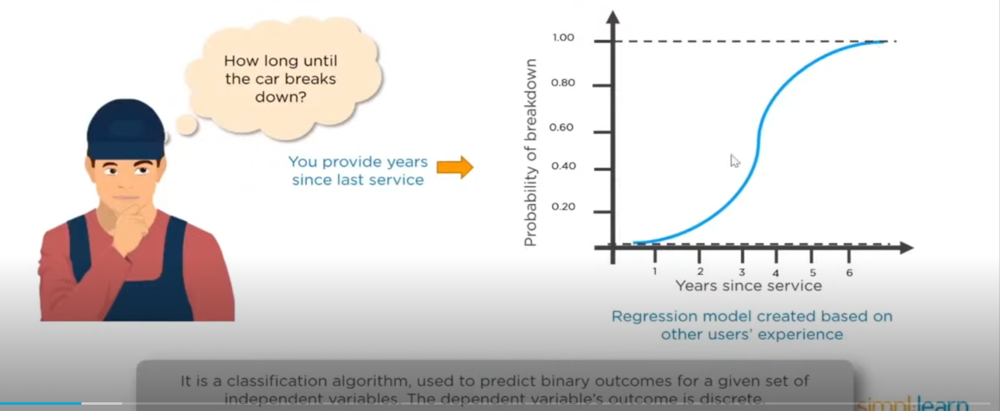

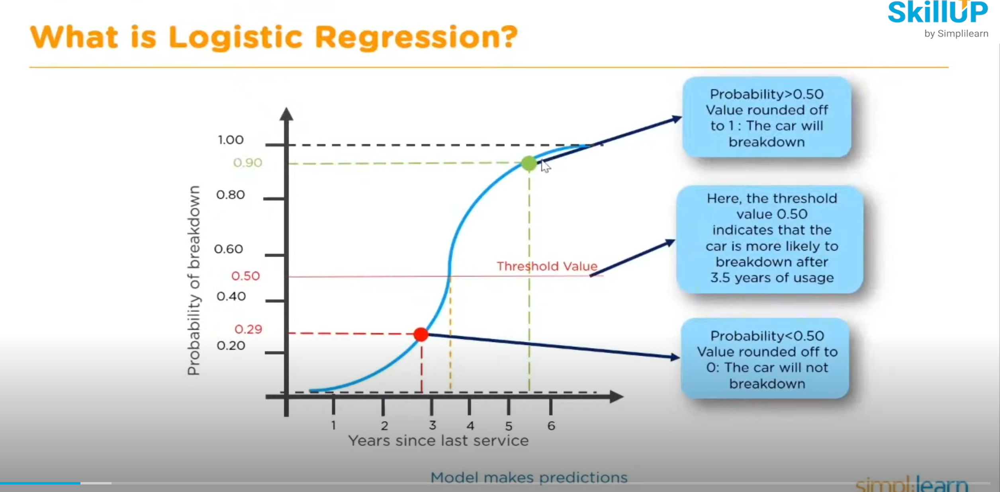

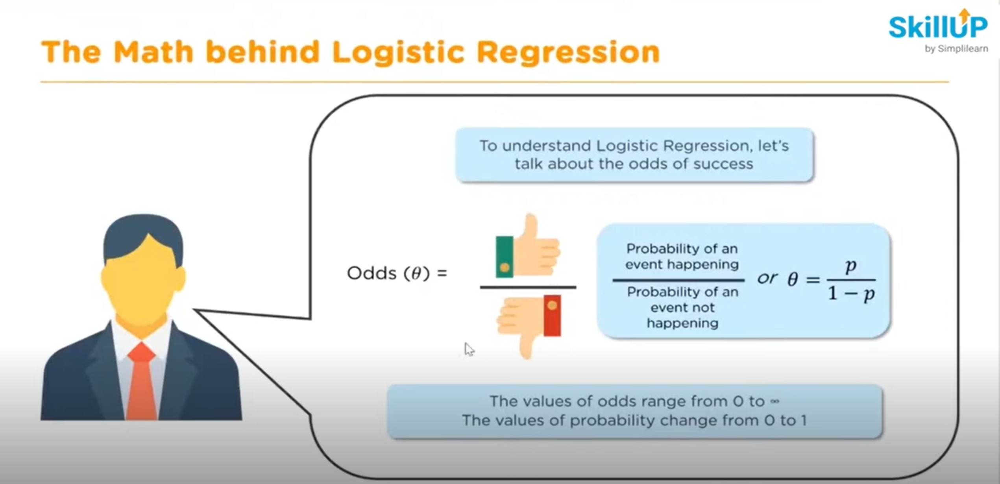

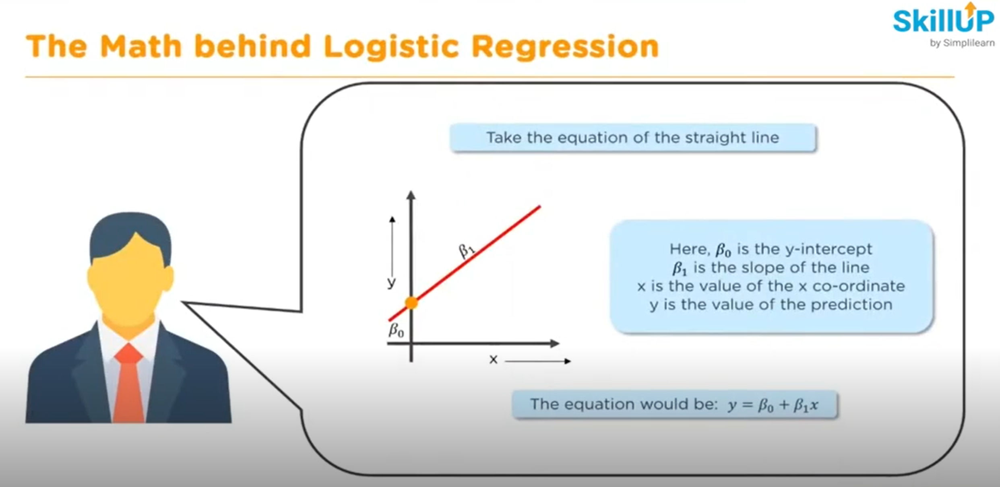

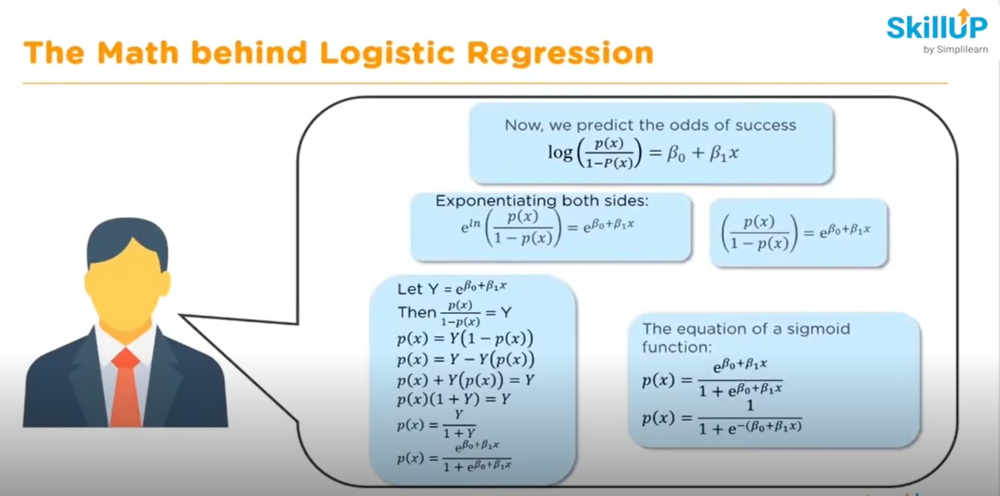

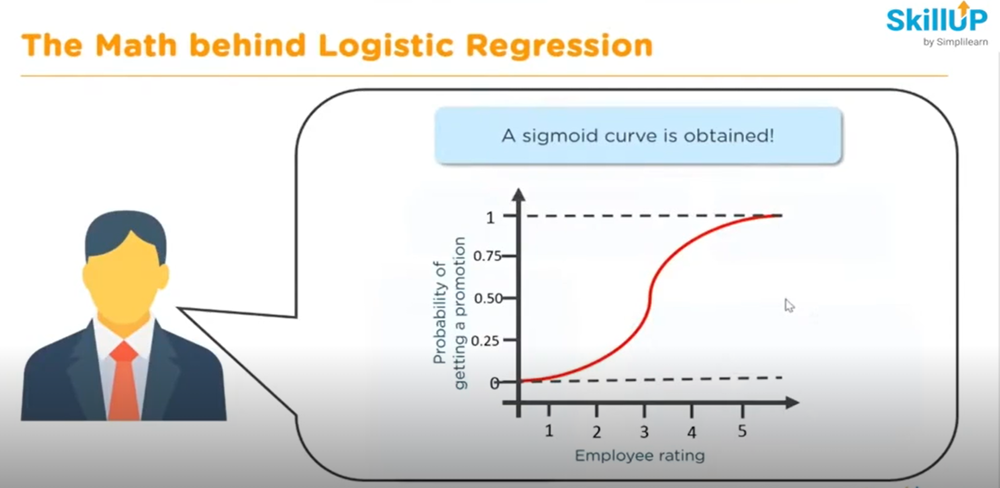

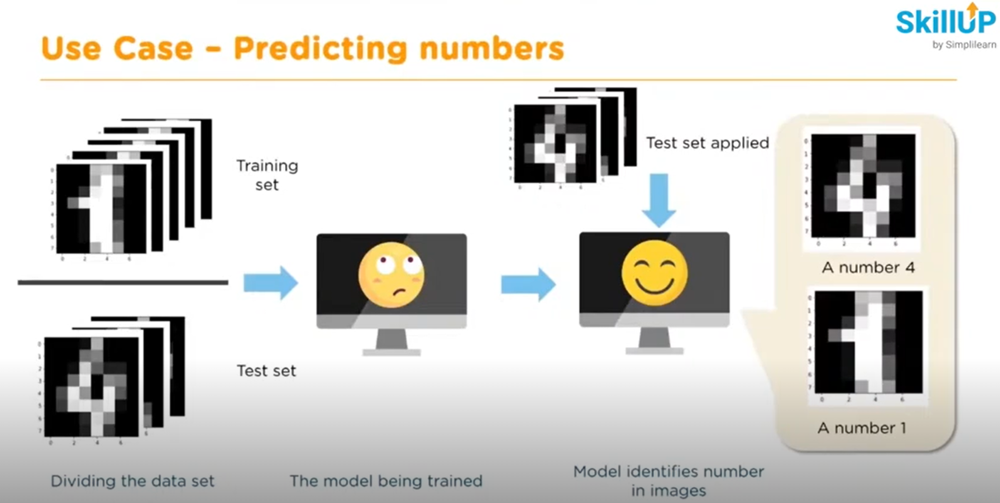

Lets begin

In [4]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
%matplotlib inline
digits = load_digits()

In [7]:
print(digits.data.shape)
print(digits.target.shape)

(1797, 64)
(1797,)


Check the images

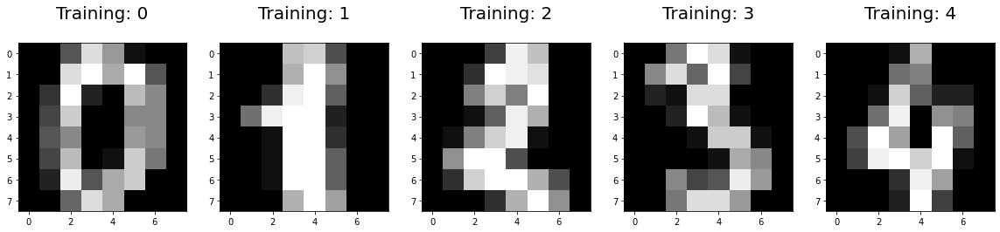

In [10]:
plt.figure(figsize=(20,4))
for index, (image, label) in enumerate(zip(digits.data[0:5],digits.target[0:5])):
    plt.subplot(1, 5,index +1 )
    plt.imshow(np.reshape(image,(8,8)),cmap=plt.cm.gray)
    plt.title('Training: %i\n' % label, fontsize=20)

In [38]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test =train_test_split(digits.data, digits.target, test_size=0.20, random_state=2)

In [39]:
print(x_train.shape)

(1437, 64)


In [40]:
print(y_train.shape)

(1437,)


In [41]:
print(x_test.shape)

(360, 64)


In [42]:
print(y_test.shape)

(360,)


In [43]:
from sklearn.linear_model import LogisticRegression

In [47]:
logisticReg = LogisticRegression(solver='newton-cg')
logisticReg.fit(x_train, y_train)

LogisticRegression(solver='newton-cg')

In [50]:
print(logisticReg.predict(x_test[0].reshape(1,-1)))

[4]


In [53]:
logisticReg.predict(x_test[0:10])

array([4, 0, 9, 1, 8, 7, 1, 5, 1, 6])

In [55]:
predictions = logisticReg.predict(x_test)

In [57]:
score =logisticReg.score(x_test,y_test)
print(score)

0.9416666666666667


In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

In [60]:
cm = metrics.confusion_matrix(y_test,predictions)

In [61]:
print(cm)

[[31  0  0  0  1  0  0  0  0  0]
 [ 0 41  0  1  0  0  0  0  1  1]
 [ 0  0 31  0  0  0  0  0  0  0]
 [ 0  0  0 33  0  0  0  2  1  0]
 [ 0  0  0  0 31  0  0  0  3  1]
 [ 0  1  0  0  1 40  0  0  0  1]
 [ 0  1  0  0  0  0 33  0  1  0]
 [ 0  0  0  0  0  0  0 39  0  1]
 [ 0  0  0  0  1  0  0  0 34  1]
 [ 0  0  0  0  0  1  0  0  1 26]]


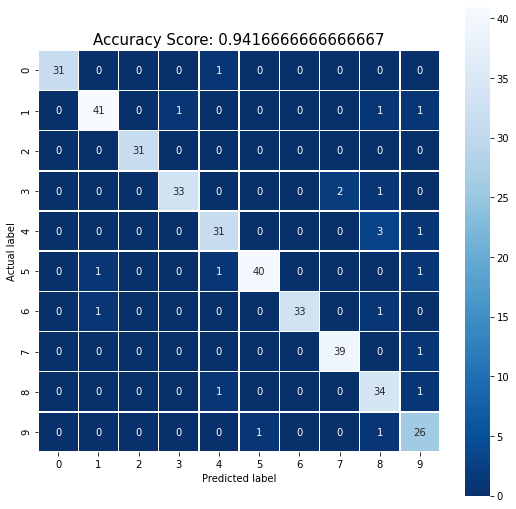

In [66]:
plt.figure(figsize=(9,9))
sns.heatmap(cm,annot=True,fmt='.3g',linewidths=.5,square=True,cmap ='Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title= 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title,size=15);

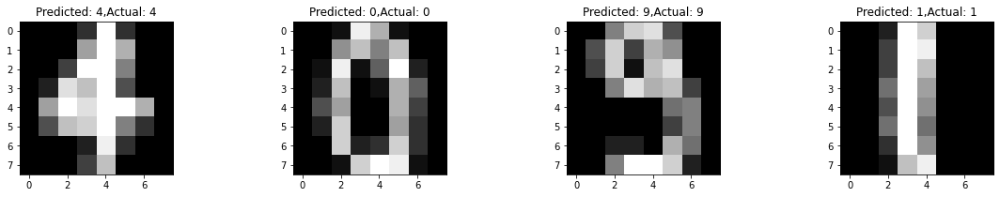

In [73]:
index = 0
classifiedIndex = []
for predict,actual in zip(predictions,y_test ):
    if predict == actual:
        classifiedIndex.append(index)
    index +=1
plt.figure(figsize=(20,3))
for plotIndex,wrong in enumerate(classifiedIndex[0:4]):
    plt.subplot(1,4,plotIndex +1)
    plt.imshow(np.reshape(x_test[wrong],(8,8)),cmap=plt.cm.gray)
    plt.title('Predicted: {},Actual: {}'.format(predictions [wrong],y_test[wrong], fontsize=20))